In [1]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm

# Define learning parameters

In [17]:
# learning parameters
batch_size = 512
epochs = 100
sample_size = 64 # fixed sample size for generator
nz = 128 # latent vector size
k = 1 # number of steps to apply to the discriminator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Prepare training dataset

In [3]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])
to_pil_image = transforms.ToPILImage()

# Make input, output folders
!mkdir -p input
!mkdir -p outputs

# Load train data
train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

# Generator

In [4]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(
            nn.Linear(self.nz, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )
    def forward(self, x):
        return self.main(x).view(-1, 1, 28, 28)

# Discriminator

In [5]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

In [6]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)
print('##### GENERATOR #####')
print(generator)
print('######################')
print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

##### GENERATOR #####
Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=1024, out_features=784, bias=True)
    (7): Tanh()
  )
)
######################

##### DISCRIMINATOR #####
Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1

# Tools for training

In [7]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

In [8]:
# loss function
criterion = nn.BCELoss() # Binary Cross Entropy loss

In [9]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

In [10]:
# to create real labels (1s)
def label_real(size):
    data = torch.ones(size)
    return data.to(device)
# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size)
    return data.to(device)


In [11]:
# function to create the noise vector
def create_noise(sample_size, nz):
    return torch.randn(sample_size, nz).to(device)

In [12]:
# to save the images generated by the generator
def save_generator_image(image, path):
    save_image(image, path)

In [13]:
# create the noise vector - fixed to track how GAN is trained.
noise = create_noise(sample_size, nz)

# Q. Write training loop

In [15]:
# device = 'mps'

mkdir: outputs_d: File exists


118it [00:08, 13.54it/s]                         


Epoch 1 of 200
Generator loss: 0.04164153, Discriminator loss: 0.00057143


118it [00:08, 13.84it/s]                         


Epoch 2 of 200
Generator loss: 0.02177831, Discriminator loss: 0.00305724


118it [00:08, 13.43it/s]                         


Epoch 3 of 200
Generator loss: 0.01395686, Discriminator loss: 0.00411935


118it [00:08, 13.55it/s]                         


Epoch 4 of 200
Generator loss: 0.00640532, Discriminator loss: 0.00805223


118it [00:08, 13.26it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


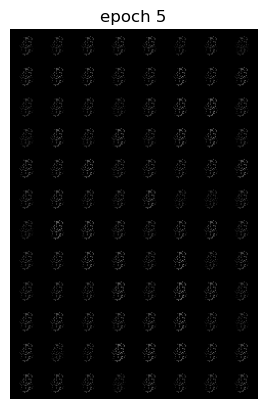

Epoch 5 of 200
Generator loss: 0.01288354, Discriminator loss: 0.00408853


118it [00:08, 13.60it/s]                         


Epoch 6 of 200
Generator loss: 0.01339685, Discriminator loss: 0.00692920


118it [00:08, 13.75it/s]                         


Epoch 7 of 200
Generator loss: 0.01990760, Discriminator loss: 0.00251825


118it [00:08, 13.89it/s]                         


Epoch 8 of 200
Generator loss: 0.02651759, Discriminator loss: 0.00274114


118it [00:08, 13.70it/s]                         


Epoch 9 of 200
Generator loss: 0.01513912, Discriminator loss: 0.00284967


118it [00:08, 13.96it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


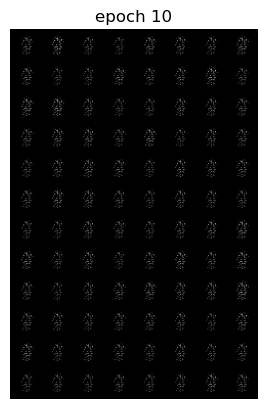

Epoch 10 of 200
Generator loss: 0.02180395, Discriminator loss: 0.00149734


118it [00:08, 13.72it/s]                         


Epoch 11 of 200
Generator loss: 0.03047265, Discriminator loss: 0.00126837


118it [00:08, 14.11it/s]                         


Epoch 12 of 200
Generator loss: 0.02322408, Discriminator loss: 0.00174718


118it [00:08, 14.08it/s]                         


Epoch 13 of 200
Generator loss: 0.01749553, Discriminator loss: 0.00269510


118it [00:08, 14.27it/s]                         


Epoch 14 of 200
Generator loss: 0.02007001, Discriminator loss: 0.00242457


118it [00:08, 14.42it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


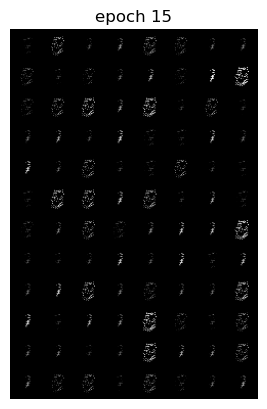

Epoch 15 of 200
Generator loss: 0.01770283, Discriminator loss: 0.00411375


118it [00:08, 14.35it/s]                         


Epoch 16 of 200
Generator loss: 0.02431110, Discriminator loss: 0.00234424


118it [00:08, 14.07it/s]                         


Epoch 17 of 200
Generator loss: 0.02031012, Discriminator loss: 0.00259146


118it [00:08, 14.11it/s]                         


Epoch 18 of 200
Generator loss: 0.03031870, Discriminator loss: 0.00086522


118it [00:08, 14.41it/s]                         


Epoch 19 of 200
Generator loss: 0.02471254, Discriminator loss: 0.00329289


118it [00:08, 14.27it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


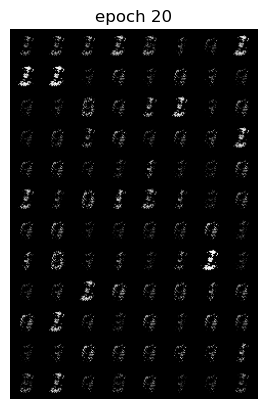

Epoch 20 of 200
Generator loss: 0.02349416, Discriminator loss: 0.00206501


118it [00:08, 14.34it/s]                         


Epoch 21 of 200
Generator loss: 0.02765114, Discriminator loss: 0.00189544


118it [00:08, 13.56it/s]                         


Epoch 22 of 200
Generator loss: 0.02539870, Discriminator loss: 0.00215429


118it [00:08, 13.64it/s]                         


Epoch 23 of 200
Generator loss: 0.02865124, Discriminator loss: 0.00174754


118it [00:08, 14.23it/s]                         


Epoch 24 of 200
Generator loss: 0.03170871, Discriminator loss: 0.00211113


118it [00:08, 14.49it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


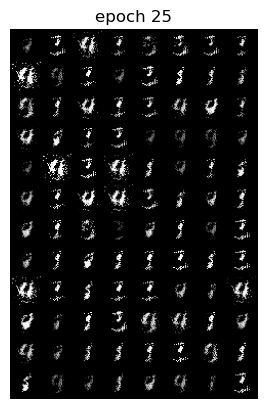

Epoch 25 of 200
Generator loss: 0.02755837, Discriminator loss: 0.00229974


118it [00:08, 14.51it/s]                         


Epoch 26 of 200
Generator loss: 0.03635020, Discriminator loss: 0.00178564


118it [00:08, 14.63it/s]                         


Epoch 27 of 200
Generator loss: 0.03173003, Discriminator loss: 0.00172190


118it [00:07, 14.82it/s]                         


Epoch 28 of 200
Generator loss: 0.02327082, Discriminator loss: 0.00299320


118it [00:07, 14.81it/s]                         


Epoch 29 of 200
Generator loss: 0.02860375, Discriminator loss: 0.00157627


118it [00:07, 14.76it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


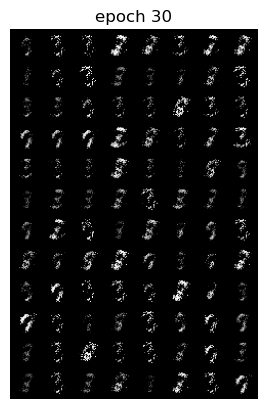

Epoch 30 of 200
Generator loss: 0.03247629, Discriminator loss: 0.00207788


118it [00:08, 14.53it/s]                         


Epoch 31 of 200
Generator loss: 0.03771530, Discriminator loss: 0.00161253


118it [00:07, 14.91it/s]                         


Epoch 32 of 200
Generator loss: 0.04153127, Discriminator loss: 0.00177286


118it [00:08, 14.05it/s]                         


Epoch 33 of 200
Generator loss: 0.03094867, Discriminator loss: 0.00170904


118it [00:08, 14.42it/s]                         


Epoch 34 of 200
Generator loss: 0.02937698, Discriminator loss: 0.00216269


118it [00:08, 14.59it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


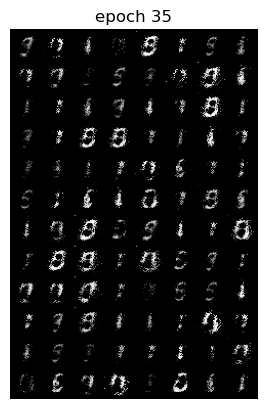

Epoch 35 of 200
Generator loss: 0.02698214, Discriminator loss: 0.00305496


118it [00:08, 14.64it/s]                         


Epoch 36 of 200
Generator loss: 0.03369174, Discriminator loss: 0.00156699


118it [00:07, 14.92it/s]                         


Epoch 37 of 200
Generator loss: 0.04242520, Discriminator loss: 0.00116380


118it [00:07, 14.83it/s]                         


Epoch 38 of 200
Generator loss: 0.03518808, Discriminator loss: 0.00174924


118it [00:08, 14.75it/s]                         


Epoch 39 of 200
Generator loss: 0.04224063, Discriminator loss: 0.00127867


118it [00:07, 14.88it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


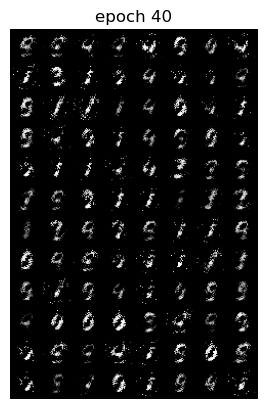

Epoch 40 of 200
Generator loss: 0.03599511, Discriminator loss: 0.00182482


118it [00:07, 14.82it/s]                         


Epoch 41 of 200
Generator loss: 0.02785383, Discriminator loss: 0.00202541


118it [00:07, 14.80it/s]                         


Epoch 42 of 200
Generator loss: 0.03106782, Discriminator loss: 0.00262026


118it [00:08, 14.75it/s]                         


Epoch 43 of 200
Generator loss: 0.03595908, Discriminator loss: 0.00191230


118it [00:08, 14.48it/s]                         


Epoch 44 of 200
Generator loss: 0.02527586, Discriminator loss: 0.00195114


118it [00:07, 14.86it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


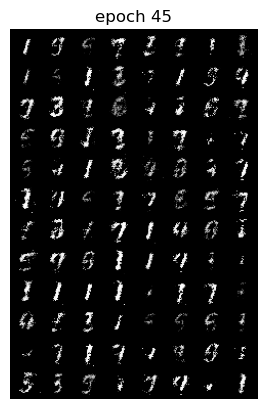

Epoch 45 of 200
Generator loss: 0.03100445, Discriminator loss: 0.00160924


118it [00:08, 14.29it/s]                         


Epoch 46 of 200
Generator loss: 0.03129990, Discriminator loss: 0.00159909


118it [00:07, 14.87it/s]                         


Epoch 47 of 200
Generator loss: 0.03146425, Discriminator loss: 0.00215710


118it [00:08, 14.41it/s]                         


Epoch 48 of 200
Generator loss: 0.03296673, Discriminator loss: 0.00177794


118it [00:08, 14.72it/s]                         


Epoch 49 of 200
Generator loss: 0.04265365, Discriminator loss: 0.00165867


118it [00:07, 14.81it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


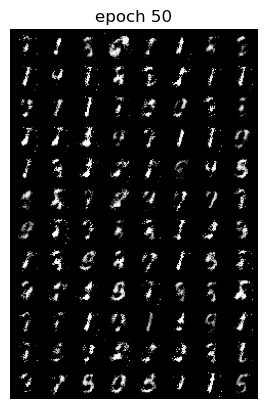

Epoch 50 of 200
Generator loss: 0.04147242, Discriminator loss: 0.00181950


118it [00:07, 14.77it/s]                         


Epoch 51 of 200
Generator loss: 0.03742595, Discriminator loss: 0.00167570


118it [00:07, 14.82it/s]                         


Epoch 52 of 200
Generator loss: 0.02826395, Discriminator loss: 0.00166977


118it [00:08, 14.73it/s]                         


Epoch 53 of 200
Generator loss: 0.02828813, Discriminator loss: 0.00187393


118it [00:08, 14.73it/s]                         


Epoch 54 of 200
Generator loss: 0.03856661, Discriminator loss: 0.00138495


118it [00:08, 13.76it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


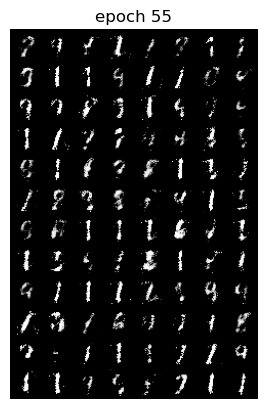

Epoch 55 of 200
Generator loss: 0.03051774, Discriminator loss: 0.00120409


118it [00:08, 14.74it/s]                         


Epoch 56 of 200
Generator loss: 0.03071610, Discriminator loss: 0.00141036


118it [00:07, 15.00it/s]                         


Epoch 57 of 200
Generator loss: 0.03502867, Discriminator loss: 0.00201704


118it [00:07, 15.24it/s]                         


Epoch 58 of 200
Generator loss: 0.03069549, Discriminator loss: 0.00238236


118it [00:07, 15.41it/s]                         


Epoch 59 of 200
Generator loss: 0.03005400, Discriminator loss: 0.00223769


118it [00:07, 15.52it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


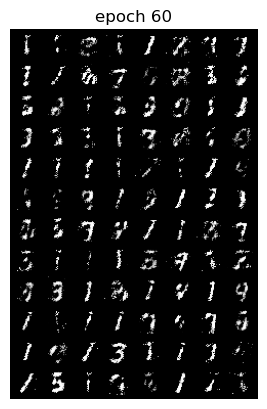

Epoch 60 of 200
Generator loss: 0.03217185, Discriminator loss: 0.00201019


118it [00:07, 15.43it/s]                         


Epoch 61 of 200
Generator loss: 0.03570217, Discriminator loss: 0.00183962


118it [00:07, 14.91it/s]                         


Epoch 62 of 200
Generator loss: 0.03699685, Discriminator loss: 0.00120367


118it [00:07, 15.17it/s]                         


Epoch 63 of 200
Generator loss: 0.03530768, Discriminator loss: 0.00146013


118it [00:07, 15.12it/s]                         


Epoch 64 of 200
Generator loss: 0.03281753, Discriminator loss: 0.00159751


118it [00:07, 14.94it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


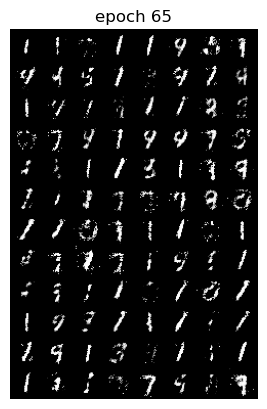

Epoch 65 of 200
Generator loss: 0.04133565, Discriminator loss: 0.00167941


118it [00:07, 15.09it/s]                         


Epoch 66 of 200
Generator loss: 0.03428936, Discriminator loss: 0.00186563


118it [00:07, 15.18it/s]                         


Epoch 67 of 200
Generator loss: 0.02836787, Discriminator loss: 0.00204972


118it [00:07, 15.26it/s]                         


Epoch 68 of 200
Generator loss: 0.02744436, Discriminator loss: 0.00226044


118it [00:07, 15.00it/s]                         


Epoch 69 of 200
Generator loss: 0.02799236, Discriminator loss: 0.00196646


118it [00:07, 15.08it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


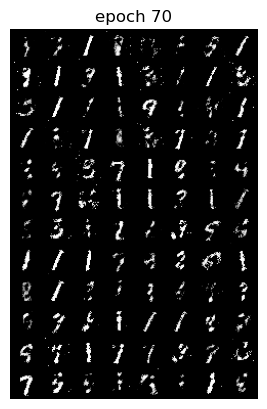

Epoch 70 of 200
Generator loss: 0.02577534, Discriminator loss: 0.00177960


118it [00:07, 15.09it/s]                         


Epoch 71 of 200
Generator loss: 0.02864555, Discriminator loss: 0.00245470


118it [00:07, 15.03it/s]                         


Epoch 72 of 200
Generator loss: 0.02809963, Discriminator loss: 0.00205454


118it [00:08, 13.62it/s]                         


Epoch 73 of 200
Generator loss: 0.02792894, Discriminator loss: 0.00127367


118it [00:08, 14.38it/s]                         


Epoch 74 of 200
Generator loss: 0.03139966, Discriminator loss: 0.00147341


118it [00:07, 15.05it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


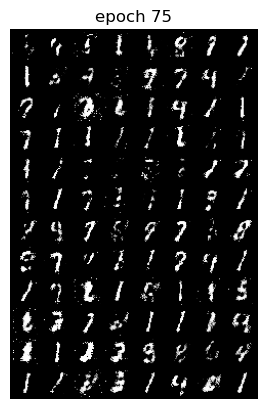

Epoch 75 of 200
Generator loss: 0.03208084, Discriminator loss: 0.00150937


118it [00:07, 15.22it/s]                         


Epoch 76 of 200
Generator loss: 0.03835323, Discriminator loss: 0.00155949


118it [00:07, 15.41it/s]                         


Epoch 77 of 200
Generator loss: 0.02289756, Discriminator loss: 0.00240018


118it [00:07, 15.33it/s]                         


Epoch 78 of 200
Generator loss: 0.04164094, Discriminator loss: 0.00167265


118it [00:08, 14.60it/s]                         


Epoch 79 of 200
Generator loss: 0.03382023, Discriminator loss: 0.00179706


118it [00:08, 14.42it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


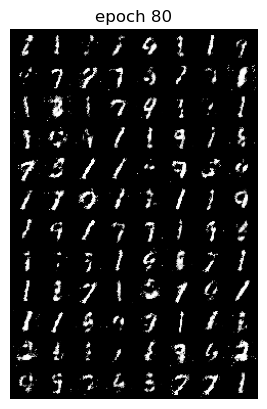

Epoch 80 of 200
Generator loss: 0.03144516, Discriminator loss: 0.00196948


118it [00:07, 14.90it/s]                         


Epoch 81 of 200
Generator loss: 0.03009849, Discriminator loss: 0.00215227


118it [00:08, 14.55it/s]                         


Epoch 82 of 200
Generator loss: 0.02768208, Discriminator loss: 0.00151216


118it [00:07, 14.80it/s]                         


Epoch 83 of 200
Generator loss: 0.02296299, Discriminator loss: 0.00325992


118it [00:07, 14.77it/s]                         


Epoch 84 of 200
Generator loss: 0.02697232, Discriminator loss: 0.00240435


118it [00:07, 14.83it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


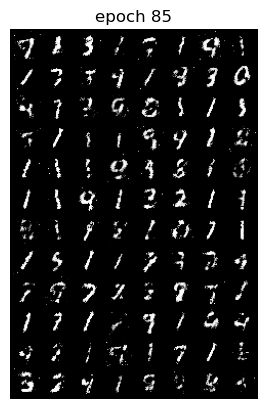

Epoch 85 of 200
Generator loss: 0.02063267, Discriminator loss: 0.00214511


118it [00:08, 14.65it/s]                         


Epoch 86 of 200
Generator loss: 0.02230100, Discriminator loss: 0.00249172


118it [00:08, 14.29it/s]                         


Epoch 87 of 200
Generator loss: 0.02462100, Discriminator loss: 0.00264455


118it [00:08, 13.72it/s]                         


Epoch 88 of 200
Generator loss: 0.02179171, Discriminator loss: 0.00266464


118it [00:07, 15.39it/s]                         


Epoch 89 of 200
Generator loss: 0.03112604, Discriminator loss: 0.00261578


118it [00:07, 15.55it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


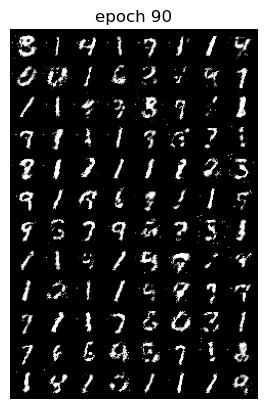

Epoch 90 of 200
Generator loss: 0.02405841, Discriminator loss: 0.00246749


118it [00:07, 15.11it/s]                         


Epoch 91 of 200
Generator loss: 0.03014840, Discriminator loss: 0.00266427


118it [00:07, 15.59it/s]                         


Epoch 92 of 200
Generator loss: 0.02620302, Discriminator loss: 0.00243911


118it [00:07, 15.37it/s]                         


Epoch 93 of 200
Generator loss: 0.02643442, Discriminator loss: 0.00275715


118it [00:07, 15.37it/s]                         


Epoch 94 of 200
Generator loss: 0.02544949, Discriminator loss: 0.00264740


118it [00:07, 15.36it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


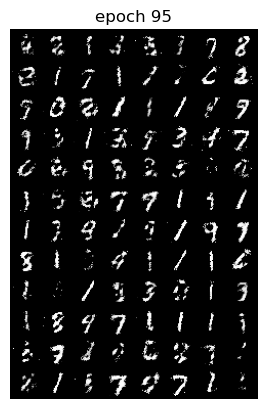

Epoch 95 of 200
Generator loss: 0.02274364, Discriminator loss: 0.00257152


118it [00:07, 15.30it/s]                         


Epoch 96 of 200
Generator loss: 0.02270369, Discriminator loss: 0.00305945


118it [00:07, 15.38it/s]                         


Epoch 97 of 200
Generator loss: 0.02453268, Discriminator loss: 0.00252584


118it [00:08, 14.61it/s]                         


Epoch 98 of 200
Generator loss: 0.02057904, Discriminator loss: 0.00323858


118it [00:08, 14.48it/s]                         


Epoch 99 of 200
Generator loss: 0.02811708, Discriminator loss: 0.00263418


118it [00:09, 12.71it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


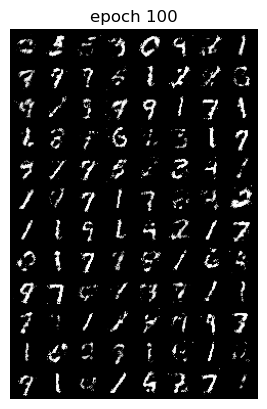

Epoch 100 of 200
Generator loss: 0.01963465, Discriminator loss: 0.00285761


118it [00:08, 14.04it/s]                         


Epoch 101 of 200
Generator loss: 0.02525871, Discriminator loss: 0.00233954


118it [00:08, 13.70it/s]                         


Epoch 102 of 200
Generator loss: 0.02195709, Discriminator loss: 0.00304642


118it [00:08, 13.62it/s]                         


Epoch 103 of 200
Generator loss: 0.02174219, Discriminator loss: 0.00328215


118it [00:08, 14.13it/s]                         


Epoch 104 of 200
Generator loss: 0.02529328, Discriminator loss: 0.00300861


118it [00:08, 13.57it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


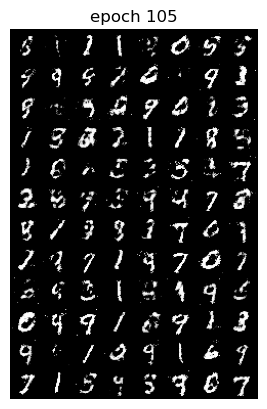

Epoch 105 of 200
Generator loss: 0.02531319, Discriminator loss: 0.00262513


118it [00:08, 14.13it/s]                         


Epoch 106 of 200
Generator loss: 0.02396917, Discriminator loss: 0.00310678


118it [00:08, 14.30it/s]                         


Epoch 107 of 200
Generator loss: 0.02811424, Discriminator loss: 0.00286970


118it [00:08, 13.98it/s]                         


Epoch 108 of 200
Generator loss: 0.01968347, Discriminator loss: 0.00273770


118it [00:08, 14.32it/s]                         


Epoch 109 of 200
Generator loss: 0.01722406, Discriminator loss: 0.00384524


118it [00:08, 14.42it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


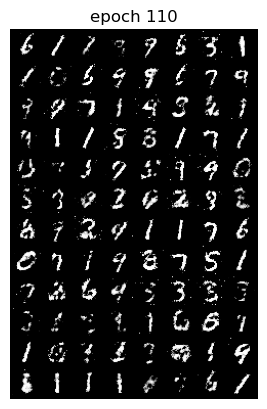

Epoch 110 of 200
Generator loss: 0.01951495, Discriminator loss: 0.00291215


118it [00:08, 14.31it/s]                         


Epoch 111 of 200
Generator loss: 0.02277513, Discriminator loss: 0.00261368


118it [00:08, 14.64it/s]                         


Epoch 112 of 200
Generator loss: 0.01969657, Discriminator loss: 0.00442697


118it [00:08, 14.61it/s]                         


Epoch 113 of 200
Generator loss: 0.02125092, Discriminator loss: 0.00279470


118it [00:07, 14.80it/s]                         


Epoch 114 of 200
Generator loss: 0.01977132, Discriminator loss: 0.00353362


118it [00:07, 14.99it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


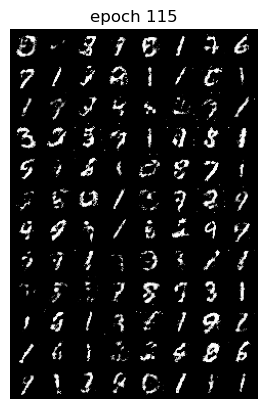

Epoch 115 of 200
Generator loss: 0.02211261, Discriminator loss: 0.00306113


118it [00:08, 14.74it/s]                         


Epoch 116 of 200
Generator loss: 0.02383466, Discriminator loss: 0.00307364


118it [00:08, 14.65it/s]                         


Epoch 117 of 200
Generator loss: 0.01827817, Discriminator loss: 0.00348452


118it [00:08, 14.48it/s]                         


Epoch 118 of 200
Generator loss: 0.01995565, Discriminator loss: 0.00264784


118it [00:07, 15.06it/s]                         


Epoch 119 of 200
Generator loss: 0.01791874, Discriminator loss: 0.00396473


118it [00:07, 14.86it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


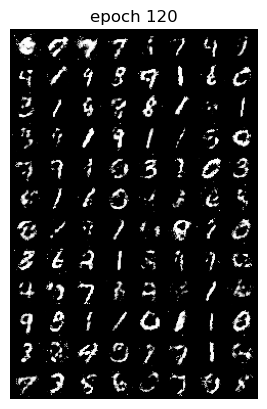

Epoch 120 of 200
Generator loss: 0.02157801, Discriminator loss: 0.00328314


118it [00:07, 14.80it/s]                         


Epoch 121 of 200
Generator loss: 0.01690020, Discriminator loss: 0.00406697


118it [00:08, 14.73it/s]                         


Epoch 122 of 200
Generator loss: 0.02220965, Discriminator loss: 0.00405632


118it [00:07, 14.88it/s]                         


Epoch 123 of 200
Generator loss: 0.01877551, Discriminator loss: 0.00398116


118it [00:08, 14.38it/s]                         


Epoch 124 of 200
Generator loss: 0.01989850, Discriminator loss: 0.00321770


118it [00:08, 14.16it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


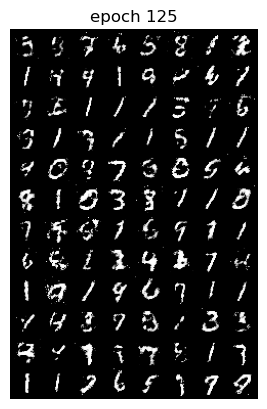

Epoch 125 of 200
Generator loss: 0.02601252, Discriminator loss: 0.00338385


118it [00:08, 14.52it/s]                         


Epoch 126 of 200
Generator loss: 0.02174305, Discriminator loss: 0.00380574


118it [00:07, 15.14it/s]                         


Epoch 127 of 200
Generator loss: 0.02145999, Discriminator loss: 0.00318890


118it [00:08, 13.98it/s]                         


Epoch 128 of 200
Generator loss: 0.01824117, Discriminator loss: 0.00352380


118it [00:08, 13.34it/s]                         


Epoch 129 of 200
Generator loss: 0.01998121, Discriminator loss: 0.00334901


118it [00:08, 14.19it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


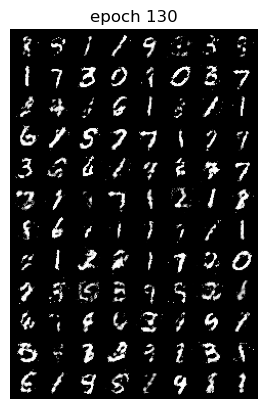

Epoch 130 of 200
Generator loss: 0.01688849, Discriminator loss: 0.00336067


118it [00:08, 14.41it/s]                         


Epoch 131 of 200
Generator loss: 0.02003721, Discriminator loss: 0.00415408


118it [00:07, 14.87it/s]                         


Epoch 132 of 200
Generator loss: 0.01687075, Discriminator loss: 0.00386267


118it [00:07, 14.78it/s]                         


Epoch 133 of 200
Generator loss: 0.02019621, Discriminator loss: 0.00312257


118it [00:08, 14.60it/s]                         


Epoch 134 of 200
Generator loss: 0.02200362, Discriminator loss: 0.00397502


118it [00:08, 14.55it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


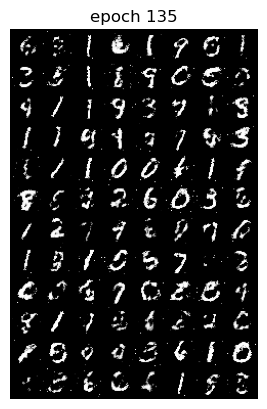

Epoch 135 of 200
Generator loss: 0.01942358, Discriminator loss: 0.00421612


118it [00:08, 14.65it/s]                         


Epoch 136 of 200
Generator loss: 0.01789811, Discriminator loss: 0.00346447


118it [00:07, 15.62it/s]                         


Epoch 137 of 200
Generator loss: 0.01788669, Discriminator loss: 0.00368235


118it [00:07, 15.79it/s]                         


Epoch 138 of 200
Generator loss: 0.02107048, Discriminator loss: 0.00369876


118it [00:08, 14.40it/s]                         


Epoch 139 of 200
Generator loss: 0.01913354, Discriminator loss: 0.00347786


118it [00:07, 15.23it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


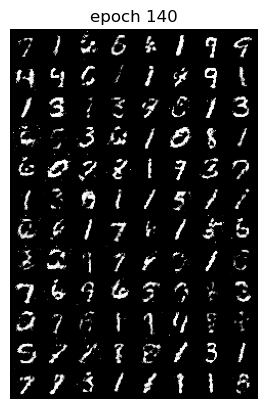

Epoch 140 of 200
Generator loss: 0.01903577, Discriminator loss: 0.00358416


118it [00:08, 14.48it/s]                         


Epoch 141 of 200
Generator loss: 0.01850305, Discriminator loss: 0.00323509


118it [00:07, 14.92it/s]                         


Epoch 142 of 200
Generator loss: 0.01924812, Discriminator loss: 0.00339682


118it [00:07, 15.04it/s]                         


Epoch 143 of 200
Generator loss: 0.01968092, Discriminator loss: 0.00377648


118it [00:07, 14.94it/s]                         


Epoch 144 of 200
Generator loss: 0.01691743, Discriminator loss: 0.00351836


118it [00:07, 15.48it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


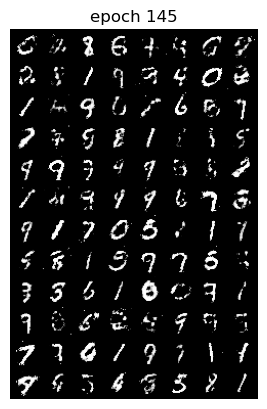

Epoch 145 of 200
Generator loss: 0.01599457, Discriminator loss: 0.00372361


118it [00:07, 15.24it/s]                         


Epoch 146 of 200
Generator loss: 0.01845447, Discriminator loss: 0.00339383


118it [00:07, 14.91it/s]                         


Epoch 147 of 200
Generator loss: 0.01761374, Discriminator loss: 0.00306900


118it [00:08, 13.61it/s]                         


Epoch 148 of 200
Generator loss: 0.02040545, Discriminator loss: 0.00315846


118it [00:07, 15.38it/s]                         


Epoch 149 of 200
Generator loss: 0.01744175, Discriminator loss: 0.00385554


118it [00:07, 14.95it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


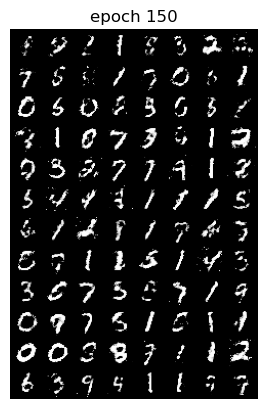

Epoch 150 of 200
Generator loss: 0.01748378, Discriminator loss: 0.00366020


118it [00:08, 14.58it/s]                         


Epoch 151 of 200
Generator loss: 0.01922844, Discriminator loss: 0.00411691


118it [00:07, 14.79it/s]                         


Epoch 152 of 200
Generator loss: 0.01955180, Discriminator loss: 0.00321336


118it [00:08, 14.69it/s]                         


Epoch 153 of 200
Generator loss: 0.01658529, Discriminator loss: 0.00392509


118it [00:08, 14.61it/s]                         


Epoch 154 of 200
Generator loss: 0.01746177, Discriminator loss: 0.00340131


118it [00:07, 15.06it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


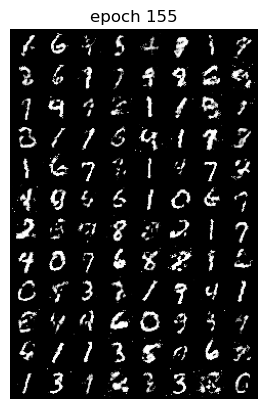

Epoch 155 of 200
Generator loss: 0.01692127, Discriminator loss: 0.00414917


118it [00:07, 14.93it/s]                         


Epoch 156 of 200
Generator loss: 0.01611283, Discriminator loss: 0.00388270


118it [00:08, 14.70it/s]                         


Epoch 157 of 200
Generator loss: 0.01605492, Discriminator loss: 0.00384873


118it [00:08, 14.62it/s]                         


Epoch 158 of 200
Generator loss: 0.01753027, Discriminator loss: 0.00384274


118it [00:07, 14.99it/s]                         


Epoch 159 of 200
Generator loss: 0.01616504, Discriminator loss: 0.00399893


118it [00:08, 14.50it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


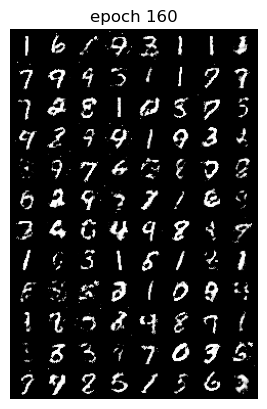

Epoch 160 of 200
Generator loss: 0.01694083, Discriminator loss: 0.00340739


118it [00:08, 14.65it/s]                         


Epoch 161 of 200
Generator loss: 0.01566551, Discriminator loss: 0.00416145


118it [00:08, 14.70it/s]                         


Epoch 162 of 200
Generator loss: 0.01824618, Discriminator loss: 0.00372087


118it [00:07, 14.94it/s]                         


Epoch 163 of 200
Generator loss: 0.01752026, Discriminator loss: 0.00358905


118it [00:07, 14.89it/s]                         


Epoch 164 of 200
Generator loss: 0.01665212, Discriminator loss: 0.00368116


118it [00:07, 15.07it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


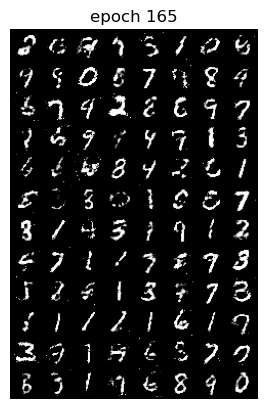

Epoch 165 of 200
Generator loss: 0.01953396, Discriminator loss: 0.00370205


118it [00:07, 15.05it/s]                         


Epoch 166 of 200
Generator loss: 0.01679977, Discriminator loss: 0.00390057


118it [00:08, 14.34it/s]                         


Epoch 167 of 200
Generator loss: 0.01993660, Discriminator loss: 0.00370028


118it [00:07, 14.84it/s]                         


Epoch 168 of 200
Generator loss: 0.01576890, Discriminator loss: 0.00397345


118it [00:07, 15.06it/s]                         


Epoch 169 of 200
Generator loss: 0.01640008, Discriminator loss: 0.00443893


118it [00:07, 15.42it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


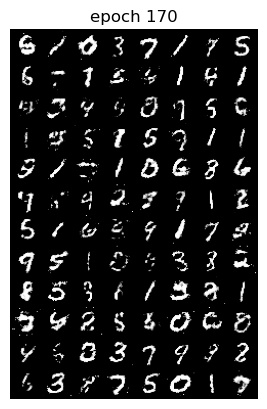

Epoch 170 of 200
Generator loss: 0.01614670, Discriminator loss: 0.00384446


118it [00:07, 15.26it/s]                         


Epoch 171 of 200
Generator loss: 0.01696330, Discriminator loss: 0.00382766


118it [00:07, 15.57it/s]                         


Epoch 172 of 200
Generator loss: 0.01718757, Discriminator loss: 0.00376273


118it [00:07, 15.24it/s]                         


Epoch 173 of 200
Generator loss: 0.01716182, Discriminator loss: 0.00360779


118it [00:07, 15.37it/s]                         


Epoch 174 of 200
Generator loss: 0.01783925, Discriminator loss: 0.00401597


118it [00:07, 15.31it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


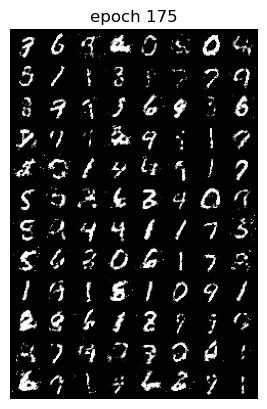

Epoch 175 of 200
Generator loss: 0.01355194, Discriminator loss: 0.00405805


118it [00:07, 15.24it/s]                         


Epoch 176 of 200
Generator loss: 0.01762481, Discriminator loss: 0.00360679


118it [00:07, 15.42it/s]                         


Epoch 177 of 200
Generator loss: 0.01765448, Discriminator loss: 0.00440354


118it [00:07, 15.15it/s]                         


Epoch 178 of 200
Generator loss: 0.01577688, Discriminator loss: 0.00395312


118it [00:07, 15.19it/s]                         


Epoch 179 of 200
Generator loss: 0.01720292, Discriminator loss: 0.00410958


118it [00:07, 15.40it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


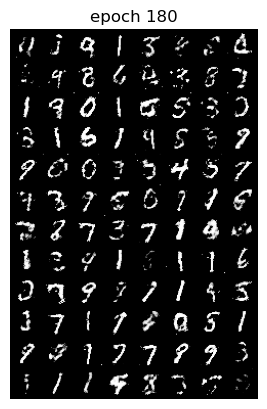

Epoch 180 of 200
Generator loss: 0.01638814, Discriminator loss: 0.00431000


118it [00:07, 15.40it/s]                         


Epoch 181 of 200
Generator loss: 0.01614802, Discriminator loss: 0.00362032


118it [00:07, 15.58it/s]                         


Epoch 182 of 200
Generator loss: 0.01895806, Discriminator loss: 0.00345198


118it [00:07, 15.29it/s]                         


Epoch 183 of 200
Generator loss: 0.01480910, Discriminator loss: 0.00428061


118it [00:07, 15.54it/s]                         


Epoch 184 of 200
Generator loss: 0.01719100, Discriminator loss: 0.00409882


118it [00:07, 15.57it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


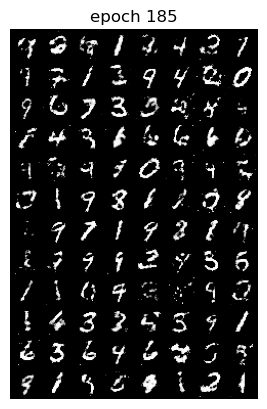

Epoch 185 of 200
Generator loss: 0.01576639, Discriminator loss: 0.00390467


118it [00:08, 14.66it/s]                         


Epoch 186 of 200
Generator loss: 0.01273336, Discriminator loss: 0.00386778


118it [00:09, 12.49it/s]                         


Epoch 187 of 200
Generator loss: 0.01534867, Discriminator loss: 0.00422418


118it [00:09, 12.37it/s]                         


Epoch 188 of 200
Generator loss: 0.01504263, Discriminator loss: 0.00405613


118it [00:09, 12.86it/s]                         


Epoch 189 of 200
Generator loss: 0.01306190, Discriminator loss: 0.00402080


118it [00:09, 12.90it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


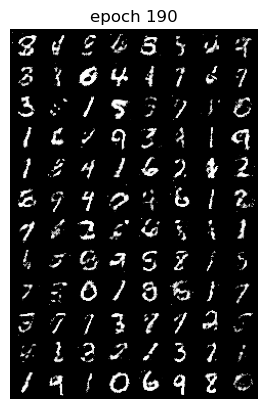

Epoch 190 of 200
Generator loss: 0.01297904, Discriminator loss: 0.00403838


118it [00:09, 12.45it/s]                         


Epoch 191 of 200
Generator loss: 0.01462710, Discriminator loss: 0.00429572


118it [00:09, 12.22it/s]                         


Epoch 192 of 200
Generator loss: 0.01383560, Discriminator loss: 0.00453959


118it [00:09, 12.40it/s]                         


Epoch 193 of 200
Generator loss: 0.01781160, Discriminator loss: 0.00399775


118it [00:09, 12.32it/s]                         


Epoch 194 of 200
Generator loss: 0.01780783, Discriminator loss: 0.00396489


118it [00:09, 12.10it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


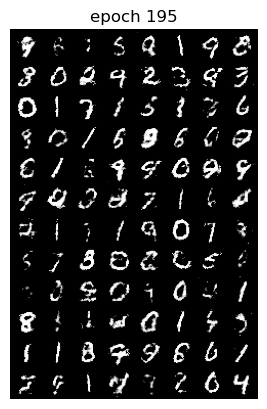

Epoch 195 of 200
Generator loss: 0.01483081, Discriminator loss: 0.00386087


118it [00:09, 12.66it/s]                         


Epoch 196 of 200
Generator loss: 0.01727652, Discriminator loss: 0.00431362


118it [00:09, 12.64it/s]                         


Epoch 197 of 200
Generator loss: 0.01732324, Discriminator loss: 0.00422834


118it [00:09, 12.52it/s]                         


Epoch 198 of 200
Generator loss: 0.01589947, Discriminator loss: 0.00395331


118it [00:09, 12.92it/s]                         


Epoch 199 of 200
Generator loss: 0.01579368, Discriminator loss: 0.00432090


118it [00:09, 12.98it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


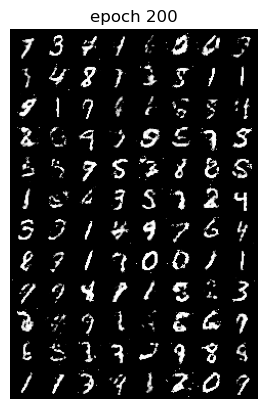

Epoch 200 of 200
Generator loss: 0.01404282, Discriminator loss: 0.00385586


In [18]:
torch.manual_seed(7777)
!mkdir outputs_d
def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)
    
    
    ######################################
    
def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)
    
    
    ######################################
    
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator
epochs = 200
for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        real_images, _ = data
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        noise = create_noise(batch_size, nz)
        fake_sample = generator(noise)
        disc_r_samp = discriminator(real_images).view(-1)
        lossD_realSample = criterion(disc_r_samp, label_real(batch_size))
        disc_f_samp = discriminator(fake_sample).view(-1)
        lossD_fakeSample = criterion(disc_f_samp, label_fake(batch_size)) 
        loss_d = (0.3*lossD_realSample + 0.7*lossD_fakeSample)
        discriminator.zero_grad()
        loss_d.backward(retain_graph=True)
        optim_d.step()
        
        lossD_fakeSample = discriminator(fake_sample).view(-1)
        loss_g = criterion(lossD_fakeSample, label_real(batch_size))        
        generator.zero_grad()
        loss_g.backward()
        optim_g.step()
        
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs_d/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [19]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs_d/generator.pth')

DONE TRAINING


In [20]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs_d/generator_images.gif', imgs)

In [21]:
losses_g_up = [a.detach().numpy() if a!=0 else a for a in losses_g]
losses_d_up = [a.detach().numpy() if a!=0 else a for a in losses_d]

In [22]:
losses_g_with_updates = losses_g
losses_d_with_updates = losses_d


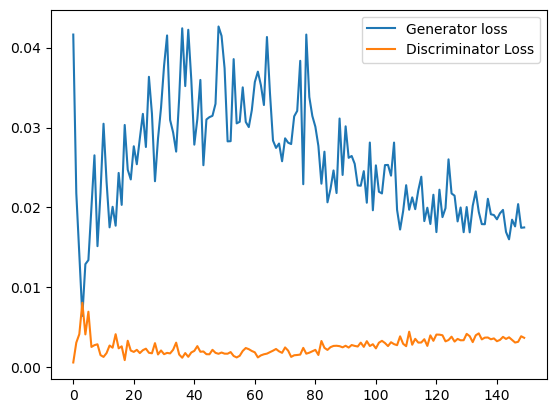

In [24]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g_up[:150], label='Generator loss')
plt.plot(losses_d_up[:150], label='Discriminator Loss')
plt.legend()
plt.savefig('outputs_d/loss_rev.png')

In [26]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)
print('##### GENERATOR #####')
print(generator)
print('######################')
print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

##### GENERATOR #####
Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=1024, out_features=784, bias=True)
    (7): Tanh()
  )
)
######################

##### DISCRIMINATOR #####
Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1

In [27]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

In [28]:
# loss function
criterion = nn.BCELoss() # Binary Cross Entropy loss

In [29]:
!mkdir outputs_b

losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

118it [00:07, 15.45it/s]                         


Epoch 1 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.53it/s]                         


Epoch 2 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.64it/s]                         


Epoch 3 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.07it/s]                         


Epoch 4 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.23it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


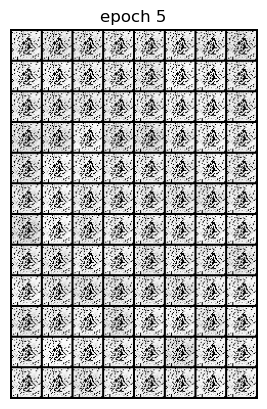

Epoch 5 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.55it/s]                         


Epoch 6 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.43it/s]                         


Epoch 7 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.55it/s]                         


Epoch 8 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                         


Epoch 9 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.00it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


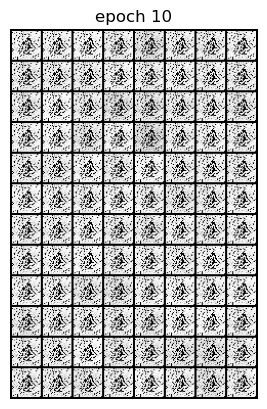

Epoch 10 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.64it/s]                         


Epoch 11 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.67it/s]                         


Epoch 12 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.57it/s]                         


Epoch 13 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.38it/s]                         


Epoch 14 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.65it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


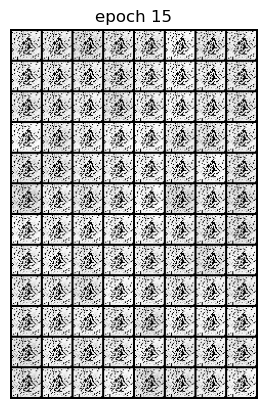

Epoch 15 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.77it/s]                         


Epoch 16 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.67it/s]                         


Epoch 17 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.84it/s]                         


Epoch 18 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.46it/s]                         


Epoch 19 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:08, 14.56it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


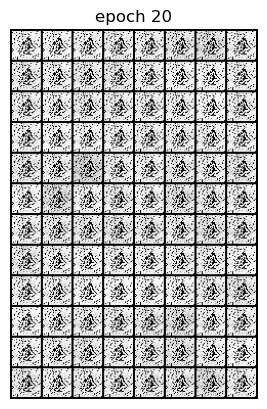

Epoch 20 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 14.80it/s]                         


Epoch 21 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.55it/s]                         


Epoch 22 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.85it/s]                         


Epoch 23 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.95it/s]                         


Epoch 24 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.01it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


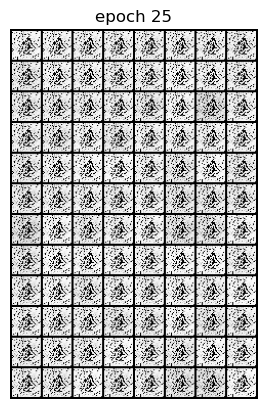

Epoch 25 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.85it/s]                         


Epoch 26 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.93it/s]                         


Epoch 27 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.99it/s]                         


Epoch 28 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.91it/s]                         


Epoch 29 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.05it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


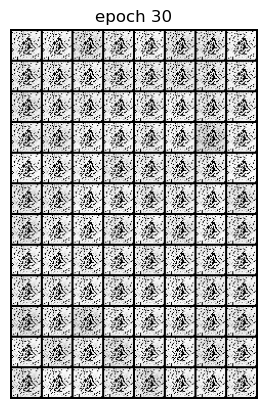

Epoch 30 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.97it/s]                         


Epoch 31 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.99it/s]                         


Epoch 32 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.01it/s]                         


Epoch 33 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.84it/s]                         


Epoch 34 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.97it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


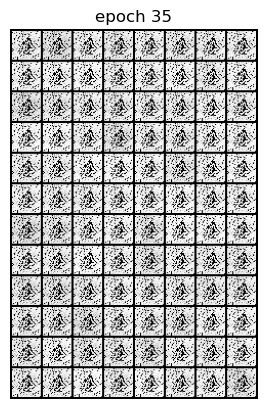

Epoch 35 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.03it/s]                         


Epoch 36 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.03it/s]                         


Epoch 37 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.03it/s]                         


Epoch 38 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.00it/s]                         


Epoch 39 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.83it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


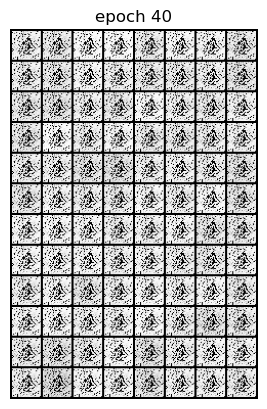

Epoch 40 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.89it/s]                         


Epoch 41 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.99it/s]                         


Epoch 42 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.97it/s]                         


Epoch 43 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.93it/s]                         


Epoch 44 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.94it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


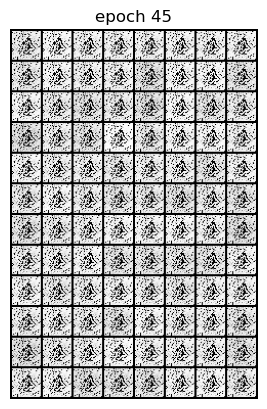

Epoch 45 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.90it/s]                         


Epoch 46 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.85it/s]                         


Epoch 47 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.95it/s]                         


Epoch 48 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.98it/s]                         


Epoch 49 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.88it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


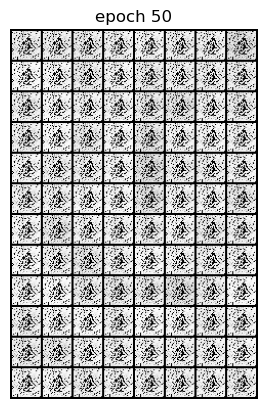

Epoch 50 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.45it/s]                         


Epoch 51 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.82it/s]                         


Epoch 52 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.79it/s]                         


Epoch 53 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.84it/s]                         


Epoch 54 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.77it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


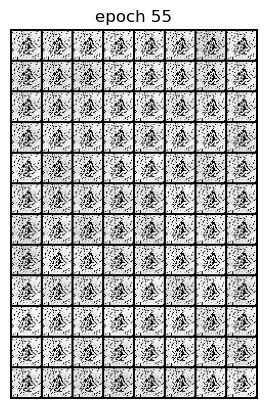

Epoch 55 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.73it/s]                         


Epoch 56 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.72it/s]                         


Epoch 57 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.81it/s]                         


Epoch 58 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.80it/s]                         


Epoch 59 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.80it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


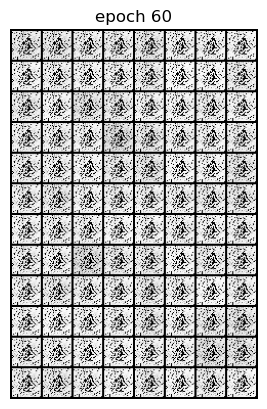

Epoch 60 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.72it/s]                         


Epoch 61 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.83it/s]                         


Epoch 62 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.82it/s]                         


Epoch 63 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.88it/s]                         


Epoch 64 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.82it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


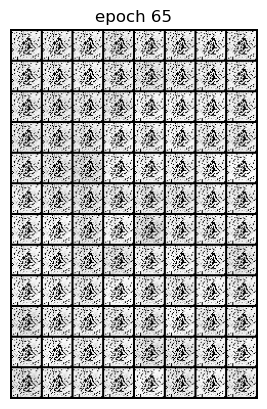

Epoch 65 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 14.83it/s]                         


Epoch 66 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.45it/s]                         


Epoch 67 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.06it/s]                         


Epoch 68 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.95it/s]                         


Epoch 69 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.86it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


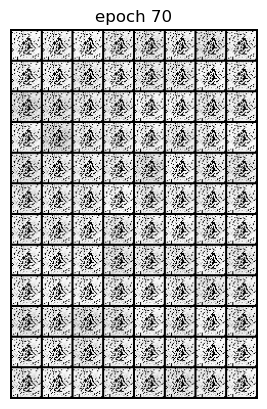

Epoch 70 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.48it/s]                         


Epoch 71 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.59it/s]                         


Epoch 72 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.53it/s]                         


Epoch 73 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.17it/s]                         


Epoch 74 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.06it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


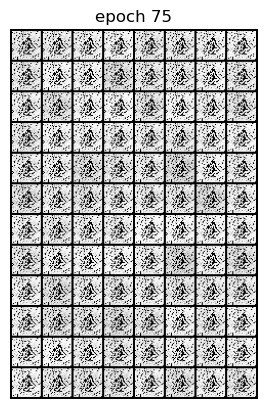

Epoch 75 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.97it/s]                         


Epoch 76 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.18it/s]                         


Epoch 77 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.13it/s]                         


Epoch 78 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.07it/s]                         


Epoch 79 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.09it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


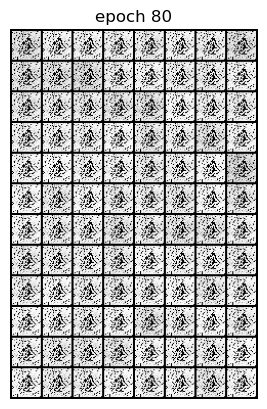

Epoch 80 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.05it/s]                         


Epoch 81 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.12it/s]                         


Epoch 82 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.10it/s]                         


Epoch 83 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.10it/s]                         


Epoch 84 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.96it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


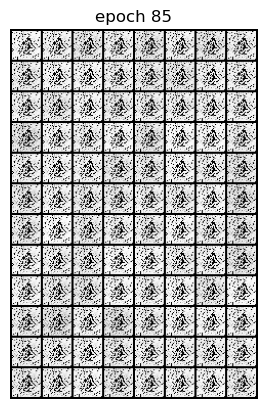

Epoch 85 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.03it/s]                         


Epoch 86 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.12it/s]                         


Epoch 87 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.17it/s]                         


Epoch 88 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.18it/s]                         


Epoch 89 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.02it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


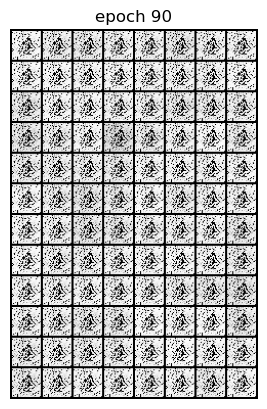

Epoch 90 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.04it/s]                         


Epoch 91 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.14it/s]                         


Epoch 92 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.09it/s]                         


Epoch 93 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.19it/s]                         


Epoch 94 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.04it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


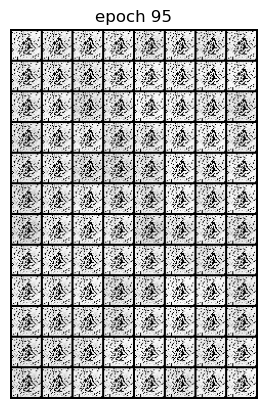

Epoch 95 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.73it/s]                         


Epoch 96 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.12it/s]                         


Epoch 97 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.06it/s]                         


Epoch 98 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.04it/s]                         


Epoch 99 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.05it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


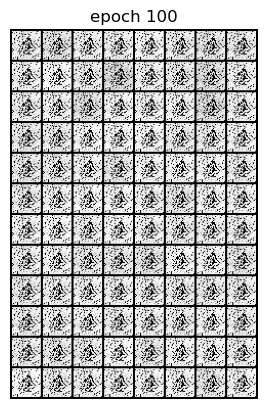

Epoch 100 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.91it/s]                         


Epoch 101 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.89it/s]                         


Epoch 102 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.20it/s]                         


Epoch 103 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.00it/s]                         


Epoch 104 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.06it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


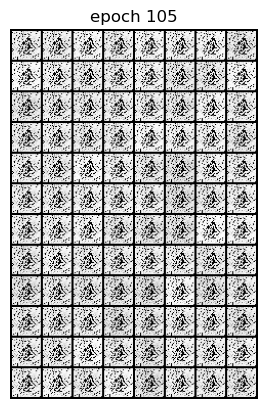

Epoch 105 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.97it/s]                         


Epoch 106 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.82it/s]                         


Epoch 107 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.86it/s]                         


Epoch 108 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.76it/s]                         


Epoch 109 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.97it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


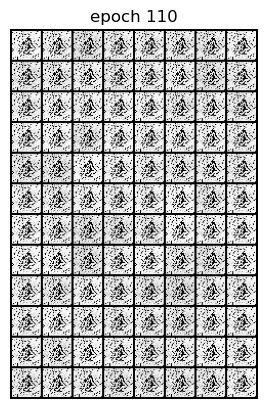

Epoch 110 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.91it/s]                         


Epoch 111 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.86it/s]                         


Epoch 112 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.82it/s]                         


Epoch 113 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.90it/s]                         


Epoch 114 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.91it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


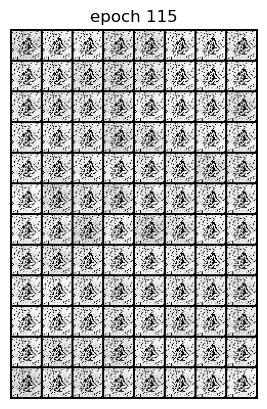

Epoch 115 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.96it/s]                         


Epoch 116 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.70it/s]                         


Epoch 117 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.99it/s]                         


Epoch 118 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.81it/s]                         


Epoch 119 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.05it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


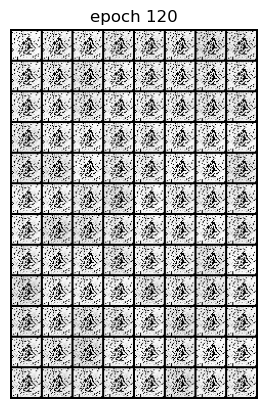

Epoch 120 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.91it/s]                         


Epoch 121 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.01it/s]                         


Epoch 122 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.09it/s]                         


Epoch 123 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.01it/s]                         


Epoch 124 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.97it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


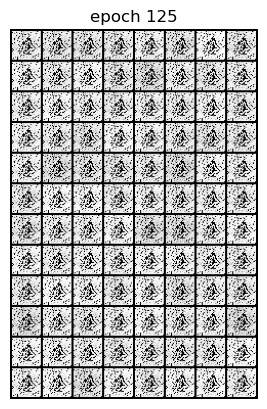

Epoch 125 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 16.03it/s]                         


Epoch 126 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.36it/s]                         


Epoch 127 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 14.99it/s]                         


Epoch 128 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.19it/s]                         


Epoch 129 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 14.90it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


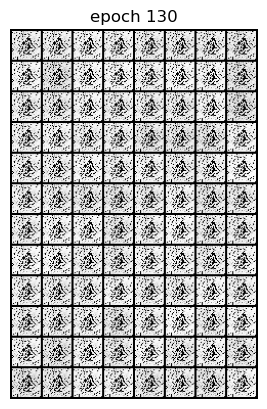

Epoch 130 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 14.99it/s]                         


Epoch 131 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.04it/s]                         


Epoch 132 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.18it/s]                         


Epoch 133 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.32it/s]                         


Epoch 134 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.21it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


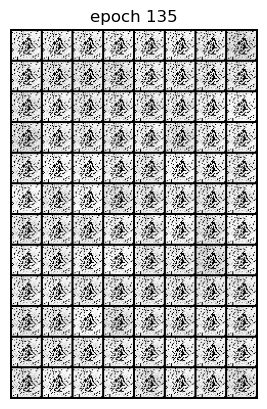

Epoch 135 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 14.99it/s]                         


Epoch 136 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.27it/s]                         


Epoch 137 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.33it/s]                         


Epoch 138 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.27it/s]                         


Epoch 139 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.33it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


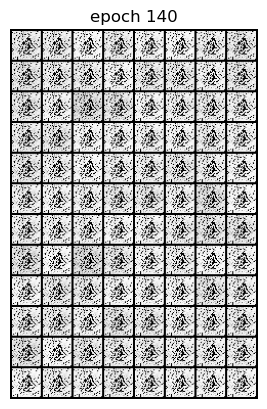

Epoch 140 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.03it/s]                         


Epoch 141 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.36it/s]                         


Epoch 142 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.45it/s]                         


Epoch 143 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.43it/s]                         


Epoch 144 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.41it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


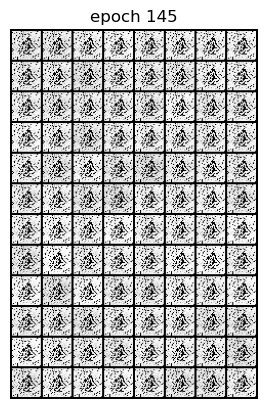

Epoch 145 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.17it/s]                         


Epoch 146 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.31it/s]                         


Epoch 147 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.50it/s]                         


Epoch 148 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                         


Epoch 149 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.55it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


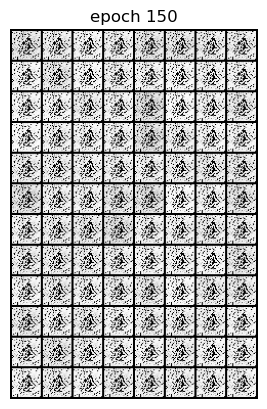

Epoch 150 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.35it/s]                         


Epoch 151 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.50it/s]                         


Epoch 152 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.48it/s]                         


Epoch 153 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.47it/s]                         


Epoch 154 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.55it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


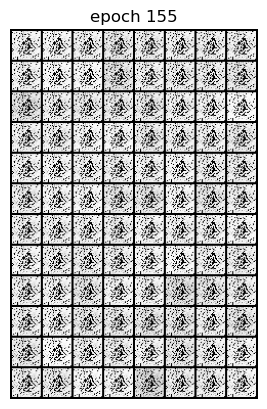

Epoch 155 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.45it/s]                         


Epoch 156 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.58it/s]                         


Epoch 157 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                         


Epoch 158 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.64it/s]                         


Epoch 159 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.64it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


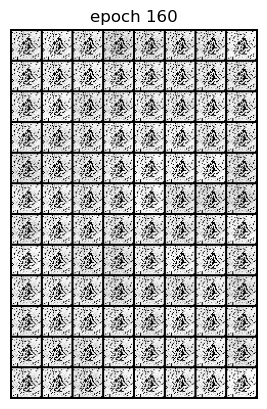

Epoch 160 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                         


Epoch 161 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.68it/s]                         


Epoch 162 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.66it/s]                         


Epoch 163 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.49it/s]                         


Epoch 164 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.59it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


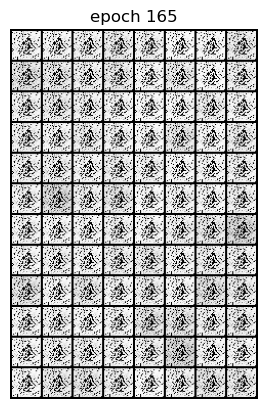

Epoch 165 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.52it/s]                         


Epoch 166 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.69it/s]                         


Epoch 167 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.69it/s]                         


Epoch 168 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.70it/s]                         


Epoch 169 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.58it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


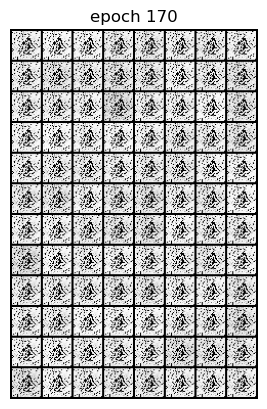

Epoch 170 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.53it/s]                         


Epoch 171 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.69it/s]                         


Epoch 172 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.78it/s]                         


Epoch 173 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.71it/s]                         


Epoch 174 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.27it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


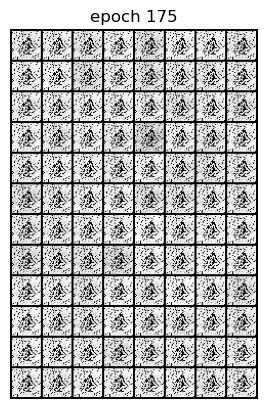

Epoch 175 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.65it/s]                         


Epoch 176 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.82it/s]                         


Epoch 177 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.85it/s]                         


Epoch 178 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.80it/s]                         


Epoch 179 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.82it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


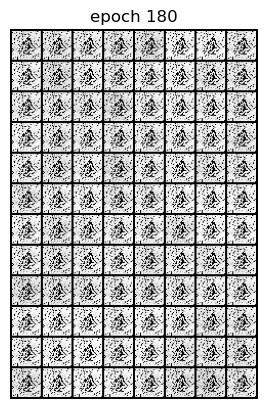

Epoch 180 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.56it/s]                         


Epoch 181 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.97it/s]                         


Epoch 182 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.84it/s]                         


Epoch 183 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.86it/s]                         


Epoch 184 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.90it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


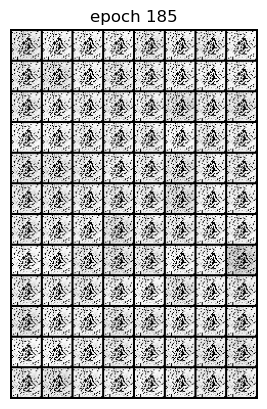

Epoch 185 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.76it/s]                         


Epoch 186 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.78it/s]                         


Epoch 187 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.97it/s]                         


Epoch 188 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.91it/s]                         


Epoch 189 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.90it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


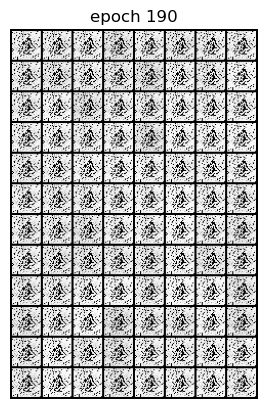

Epoch 190 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.79it/s]                         


Epoch 191 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.92it/s]                         


Epoch 192 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.66it/s]                         


Epoch 193 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.81it/s]                         


Epoch 194 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.86it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


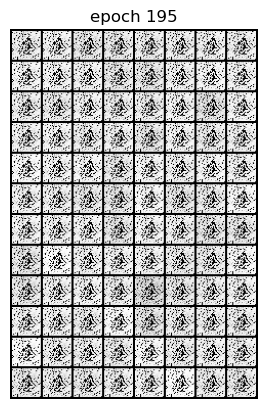

Epoch 195 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.67it/s]                         


Epoch 196 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.91it/s]                         


Epoch 197 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.76it/s]                         


Epoch 198 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.84it/s]                         


Epoch 199 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.22it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


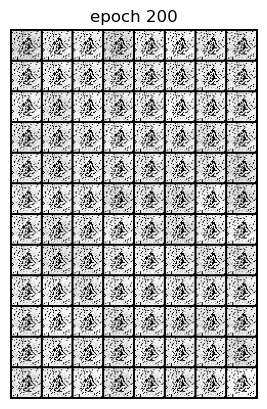

Epoch 200 of 200
Generator loss: 0.00000000, Discriminator loss: 0.00000000


In [30]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)
    
    
    ######################################
    
def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)
    
    
    ######################################


for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        real_images, _ = data
        batch_size = real_images.size(0)
        noise = create_noise(batch_size, nz)
        fake_sample = generator(noise)
        disc_r_samp = discriminator(real_images).view(-1)
        lossD_realSample = criterion(disc_r_samp, label_real(batch_size))
        disc_f_samp = discriminator(fake_sample).view(-1)
        lossD_fakeSample = criterion(disc_f_samp, label_fake(batch_size)) 
        loss_d = (lossD_realSample + lossD_fakeSample)
        discriminator.zero_grad()
        loss_d.backward(retain_graph=True)
        optim_d.step()
        
        lossD_fakeSample = discriminator(fake_sample).view(-1)
        loss_g = criterion(lossD_fakeSample, label_fake(batch_size))        
        generator.zero_grad()
        loss_g.backward()
        optim_g.step()
        
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs_b/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [31]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs_b/generator.pth')

DONE TRAINING


In [32]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs_b/generator_images.gif', imgs)

In [33]:
losses_g_up = [a.detach().numpy() if a!=0 else a for a in losses_g]
losses_d_up = [a.detach().numpy() if a!=0 else a for a in losses_d]

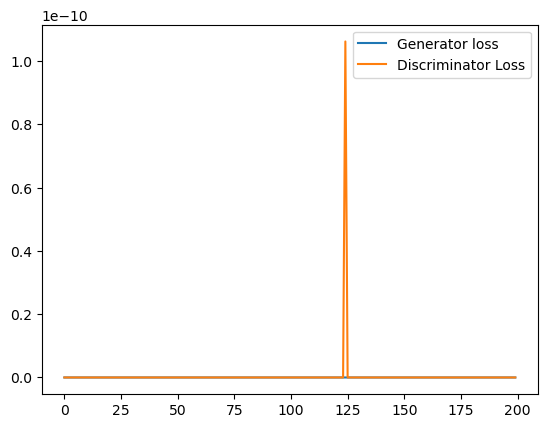

In [34]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g_up, label='Generator loss')
plt.plot(losses_d_up, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs_b/loss.png')

In [77]:
class Generator_DCGAN(nn.Module):
    def __init__(self, nz):
      nc = 1
      ngf = 28
      super(Generator_DCGAN, self).__init__()
      self.network = nn.Sequential(
          nn.ConvTranspose2d(nz, ngf*4, 4, 1, 0, bias=False),
          nn.BatchNorm2d(ngf*4),
          nn.ReLU(True),
  
          nn.ConvTranspose2d(ngf*4, ngf*2, 3, 2, 1, bias=False),
          nn.BatchNorm2d(ngf*2),
          nn.ReLU(True),
  
          nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ngf),
          nn.ReLU(True),
  
          nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
          nn.Tanh()
      )
  
    def forward(self, input):
      output = self.network(input)
      return output

In [78]:
class Discriminator_DCGAN(nn.Module):
    def __init__(self):
        nc, ndf = 1, 28
        super(Discriminator_DCGAN, self).__init__()
        self.network = nn.Sequential(
                
                nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
                nn.LeakyReLU(0.2, inplace=True),
                
                nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 2),
                nn.LeakyReLU(0.2, inplace=True),
                
                nn.Conv2d(ndf * 2, ndf * 4, 3, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 4),
                nn.LeakyReLU(0.2, inplace=True),
                
                nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
                nn.Sigmoid()
            )
    def forward(self, input):
        output = self.network(input)
        return output.view(-1, 1).squeeze(1)

In [79]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

# loss function
criterion = nn.BCELoss() # Binary Cross Entropy loss

In [80]:
device = 'mps'

In [81]:
generator = Generator_DCGAN(nz).to(device)
discriminator = Discriminator_DCGAN().to(device)
print('##### GENERATOR #####')
print(generator)
print('######################')
print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

##### GENERATOR #####
Generator_DCGAN(
  (network): Sequential(
    (0): ConvTranspose2d(128, 112, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(112, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(112, 56, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(56, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(56, 28, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(28, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(28, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)
######################

##### DISCRIMINATOR #####
Discriminator_DCGAN(
  (network): Sequential(
    (0): Conv2d(1, 28, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): 

In [82]:
!mkdir outputs_c

losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

mkdir: outputs_c: File exists


In [83]:
train_loader = DataLoader(train_data, batch_size=128, shuffle=True)

# function to create the noise vector
def create_noise_DCGAN(sample_size, nz):
    return torch.randn(sample_size, nz, 1, 1).to(device)

469it [00:20, 22.86it/s]                         


Epoch 1 of 100
Generator loss: 0.00153701, Discriminator loss: 0.00291535


469it [00:19, 24.43it/s]                         


Epoch 2 of 100
Generator loss: 0.00148311, Discriminator loss: 0.00292900


469it [00:20, 23.10it/s]                         


Epoch 3 of 100
Generator loss: 0.00144178, Discriminator loss: 0.00307859


469it [00:19, 23.63it/s]                         


Epoch 4 of 100
Generator loss: 0.00147873, Discriminator loss: 0.00300622


469it [00:19, 24.34it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


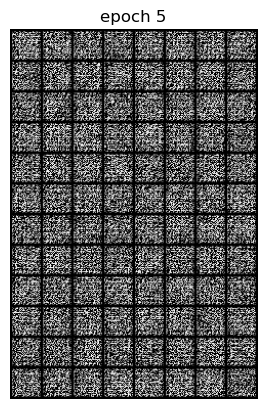

Epoch 5 of 100
Generator loss: 0.00151276, Discriminator loss: 0.00295550


469it [00:19, 24.18it/s]                         


Epoch 6 of 100
Generator loss: 0.00156327, Discriminator loss: 0.00290969


469it [00:19, 24.17it/s]                         


Epoch 7 of 100
Generator loss: 0.00154393, Discriminator loss: 0.00290524


469it [00:19, 24.41it/s]                         


Epoch 8 of 100
Generator loss: 0.00148318, Discriminator loss: 0.00297159


469it [00:19, 24.52it/s]                         


Epoch 9 of 100
Generator loss: 0.00143921, Discriminator loss: 0.00302015


469it [00:19, 24.49it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


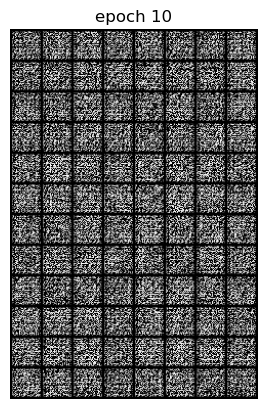

Epoch 10 of 100
Generator loss: 0.00143782, Discriminator loss: 0.00301085


469it [00:19, 24.47it/s]                         


Epoch 11 of 100
Generator loss: 0.00148148, Discriminator loss: 0.00299967


469it [00:19, 23.87it/s]                         


Epoch 12 of 100
Generator loss: 0.00145107, Discriminator loss: 0.00305005


469it [00:19, 24.39it/s]                         


Epoch 13 of 100
Generator loss: 0.00152204, Discriminator loss: 0.00293057


469it [00:19, 23.72it/s]                         


Epoch 14 of 100
Generator loss: 0.00148487, Discriminator loss: 0.00296087


469it [00:19, 23.72it/s]                         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


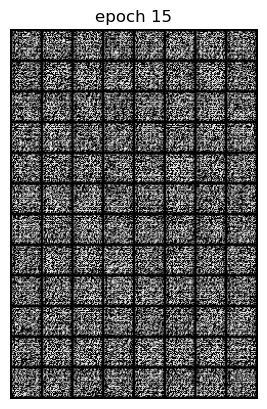

Epoch 15 of 100
Generator loss: 0.00153556, Discriminator loss: 0.00288996


 98%|█████████▊| 458/468 [00:19<00:00, 24.16it/s]

In [84]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)
    
    
    ######################################
    
def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)
    
    
    ######################################

epochs = 100

for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        real_images, _ = data
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        noise = create_noise_DCGAN(batch_size, nz)
        fake_sample = generator(noise)
        disc_r_samp = discriminator(real_images).view(-1)
        lossD_realSample = criterion(disc_r_samp, label_real(disc_r_samp.size()))
        disc_f_samp = discriminator(fake_sample).view(-1)
        lossD_fakeSample = criterion(disc_f_samp, label_fake(disc_f_samp.size())) 
        loss_d = (lossD_realSample + lossD_fakeSample)
        discriminator.zero_grad()
        loss_d.backward(retain_graph=True)
        optim_d.step()
        
        lossD_fakeSample = discriminator(fake_sample).view(-1)
        loss_g = criterion(lossD_fakeSample, label_real(lossD_fakeSample.size()))        
        generator.zero_grad()
        loss_g.backward(retain_graph=True)
        optim_g.step()
        
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs_c/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")